# Mug Detector with YOLOv5

## Setup

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/MyDrive/

/content/gdrive/MyDrive


In [ ]:
import os
if not os.path.isdir("ObjectDetection"):
  os.makedirs("ObjectDetection")

In [ ]:
!pwd

/content/gdrive/MyDrive


In [ ]:
%cd /content/gdrive/MyDrive/ObjectDetection

/content/gdrive/MyDrive/ObjectDetection


In [ ]:
!pwd

/content/gdrive/MyDrive/ObjectDetection


In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12310, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 12310 (delta 16), reused 17 (delta 13), pack-reused 12287
Receiving objects: 100% (12310/12310), 12.63 MiB | 31.24 MiB/s, done.
Resolving deltas: 100% (8484/8484), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 15.2 MB/s 
     |████████████████████████████████| 145 kB 15.8 MB/s 
     |████████████████████████████████| 178 kB 57.6 MB/s 
     |████████████████████████████████| 1.1 MB 61.4 MB/s 
     |████████████████████████████████| 67 kB 6.6 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 138 kB 66.0 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

## Get dataset from Roboflow

In [4]:
rf = Roboflow(api_key="YP5TFtmuhtP9Mgwm4DPu")
project = rf.workspace("tu-chemnitz").project("obj-detection-2zpsz")
dataset = project.version(11).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/OBJ-DETECTION-11 in yolov5pytorch:: 100%|██████████| 742/742 [00:01<00:00, 663.23it/s]


## Train The Yolo Model








In [5]:
!python train.py --img 640 --batch 16 --epochs 55 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/OBJ-DETECTION-11/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=55, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-110-ga4ed988 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

## Show Training Results

In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Prediction

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/OBJ-DETECTION-11/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-110-ga4ed988 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/21 /content/datasets/OBJ-DETECTION-11/valid/images/005_png.rf.e203ecffd0d5e46093878ebccb3f1103.jpg: 448x640 1 VW ID.3 L:4.2m W:1.8m, 12.4ms
image 2/21 /content/datasets/OBJ-DETECTION-11/valid/images/006_jpg.rf.6d26c17f773de97b6b2050ac32715dfe.jpg: 352x640 1 VW ID.3 L:4.2m W:1.8m, 13.2ms
image 3/21 /content/dat

## Display Inference Images

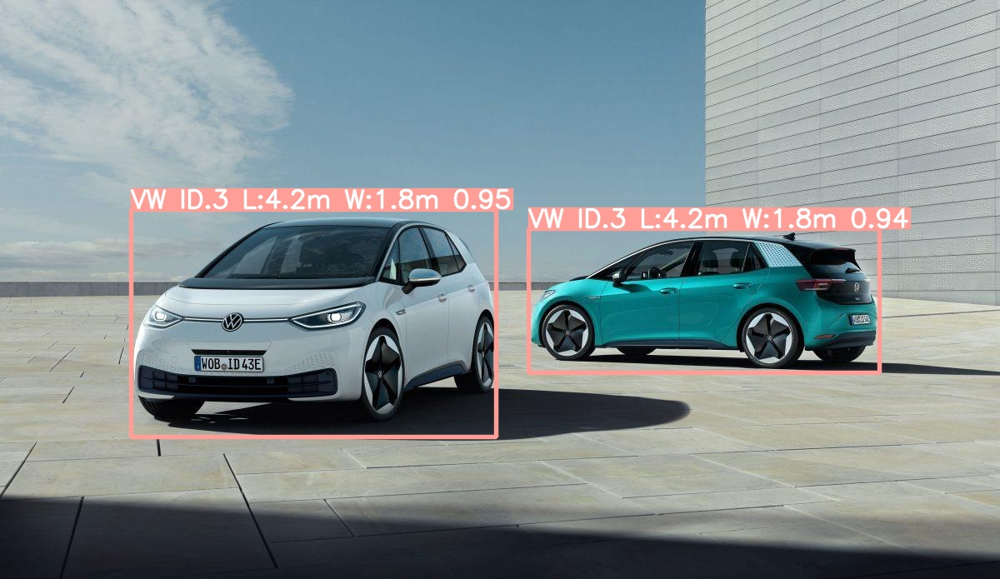

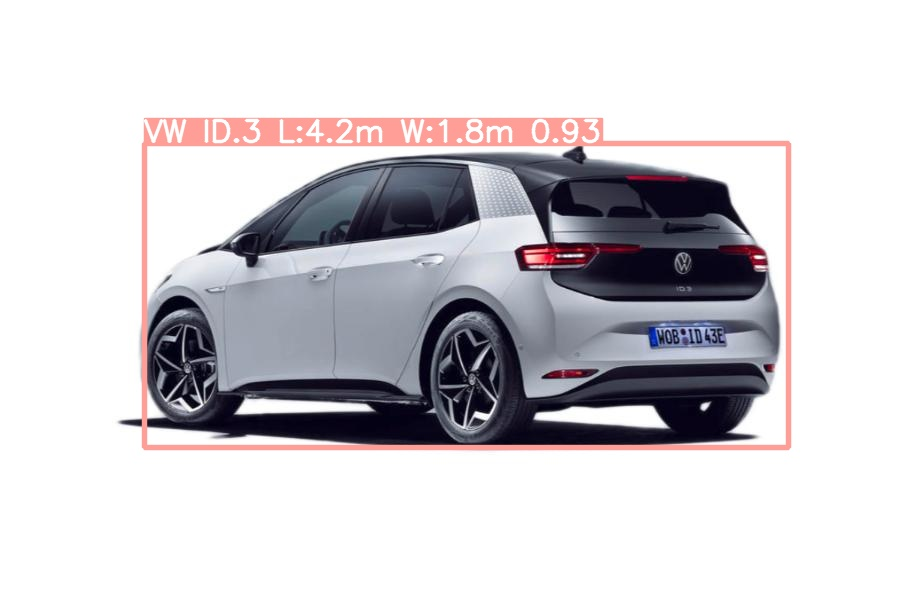

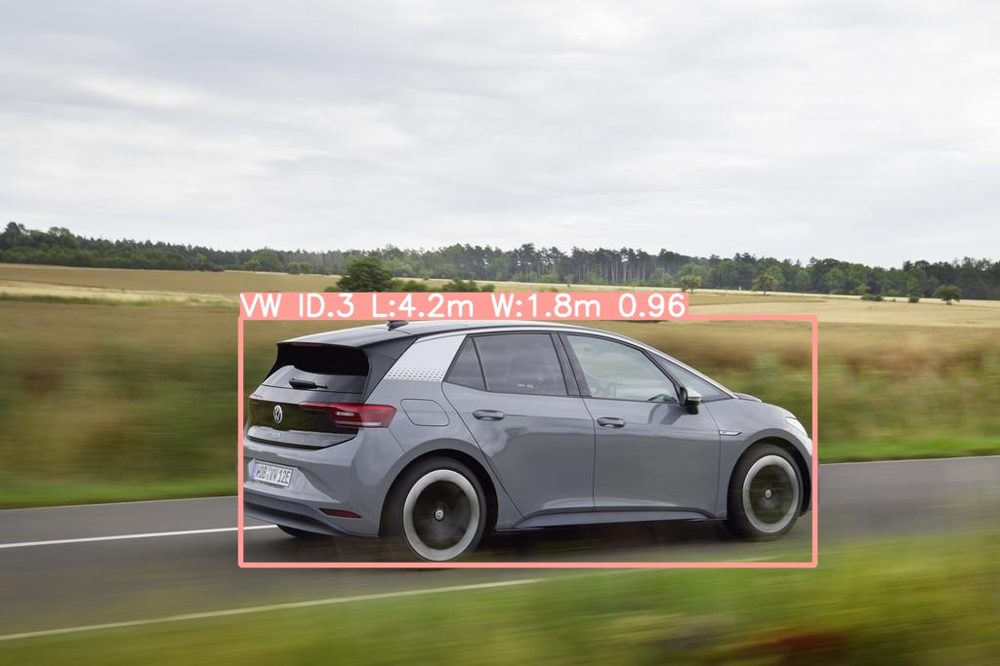

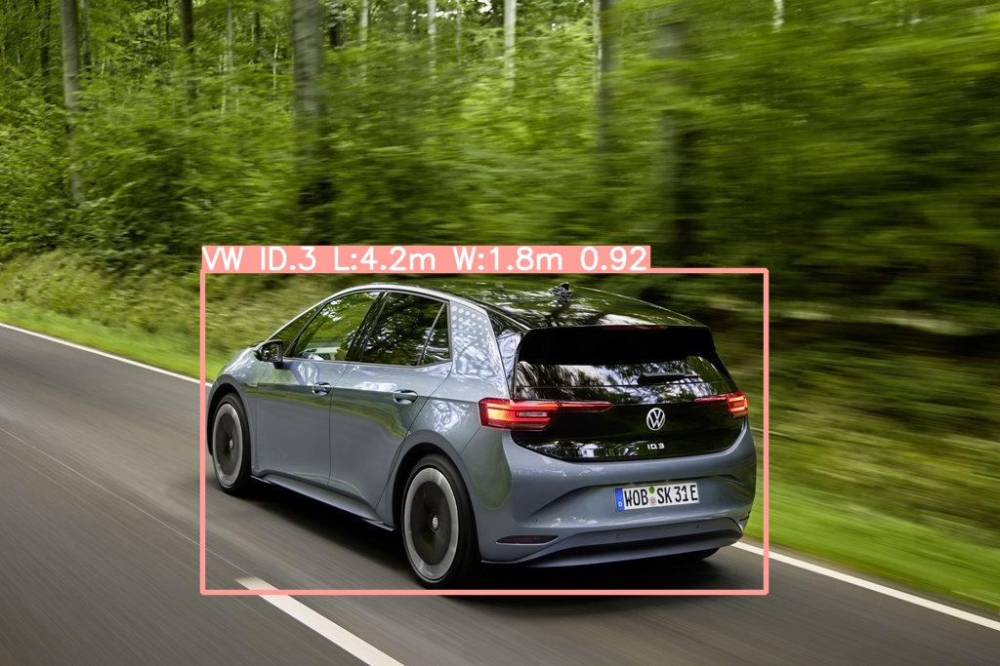

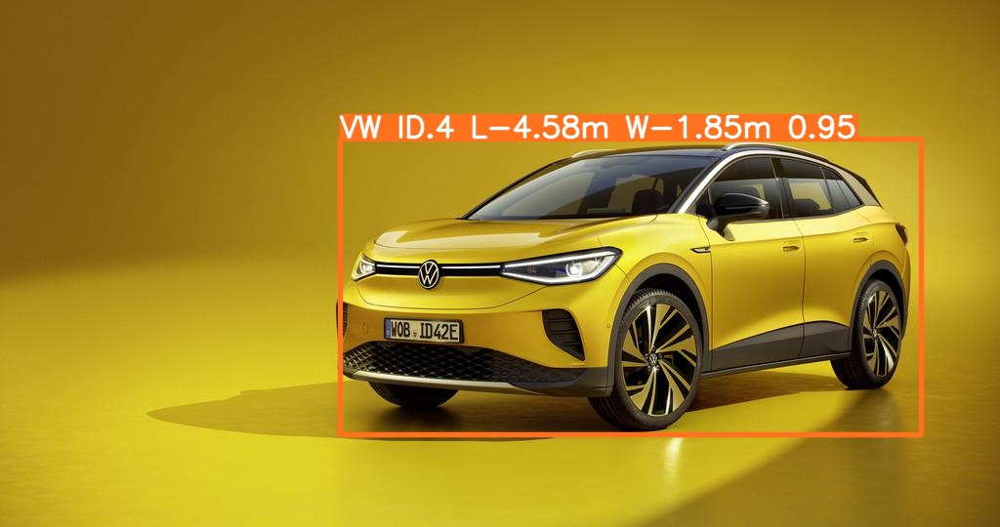

...

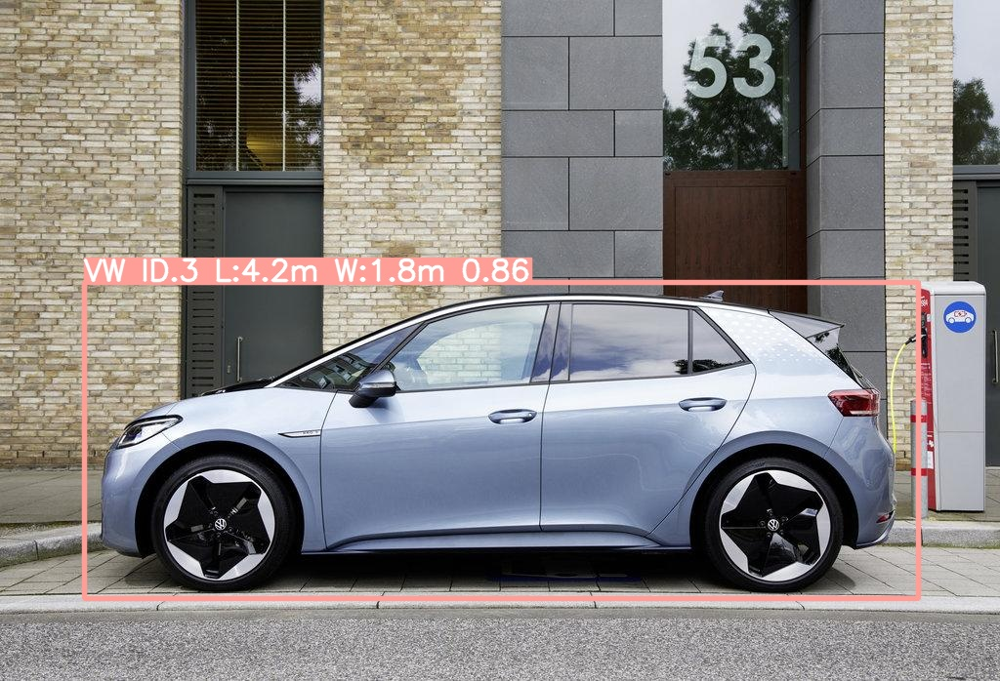

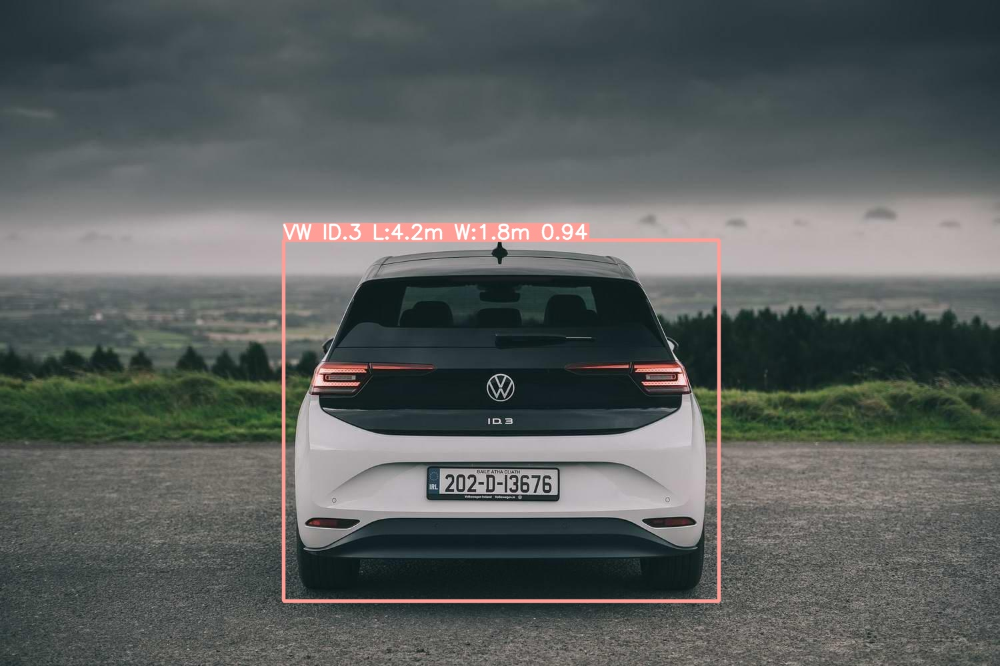

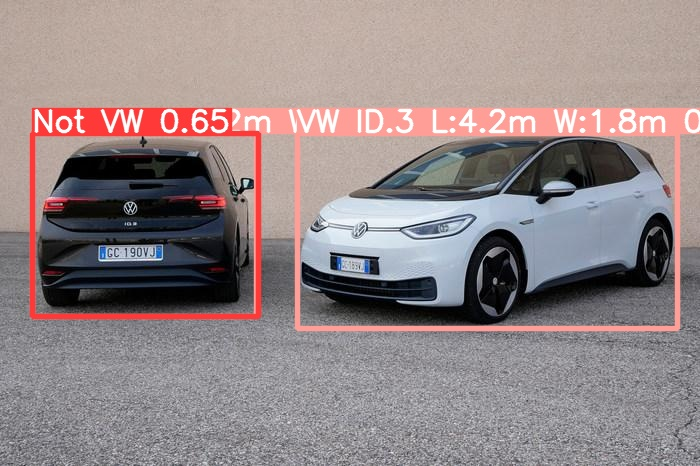

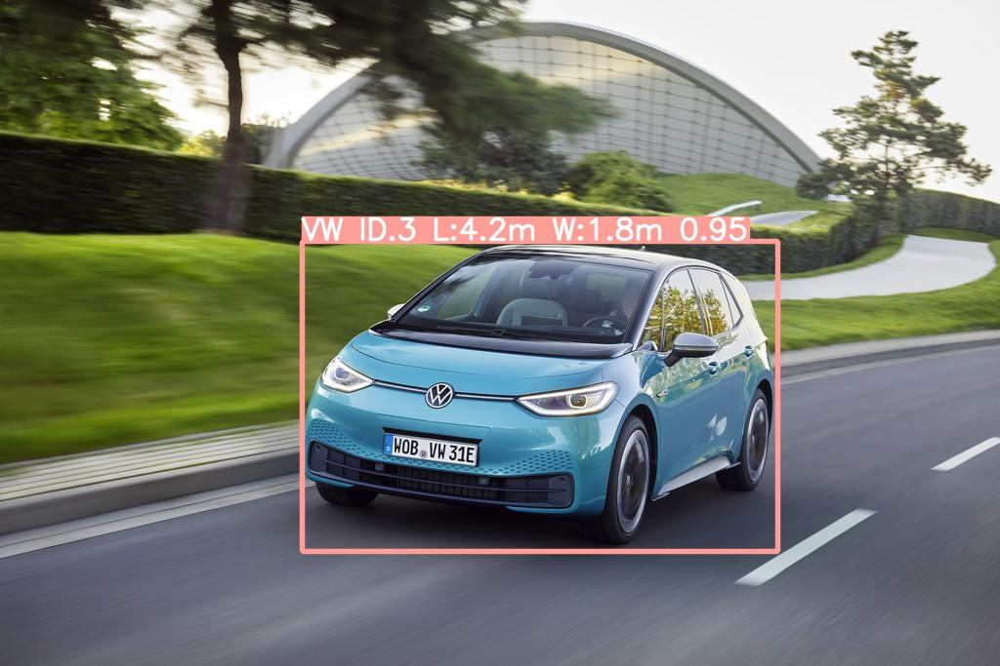

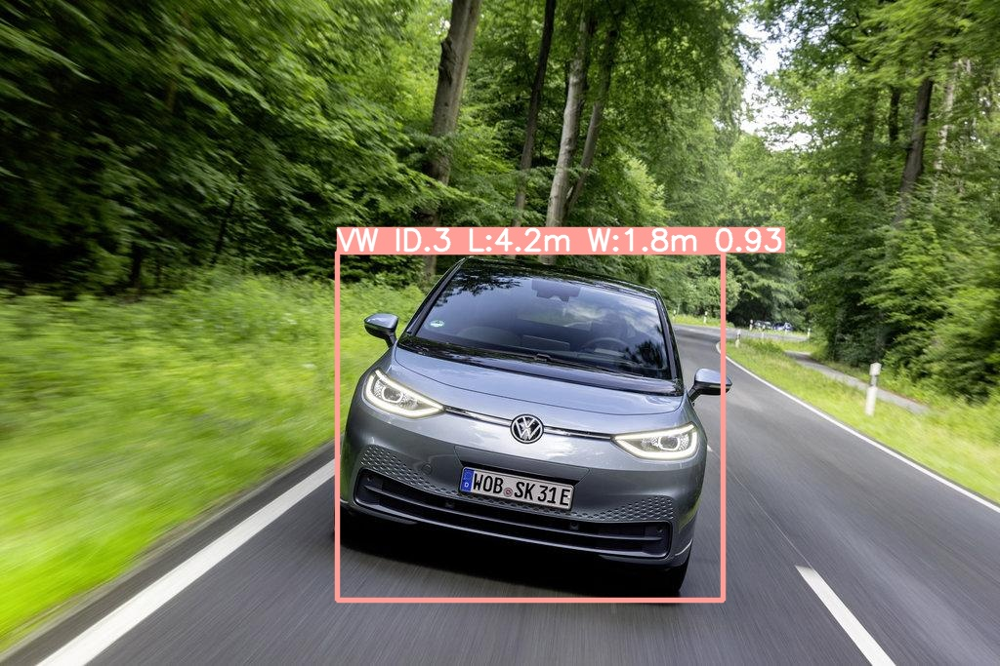

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    i += 1

    if i < 22:
      display(Image(filename=imageName))
      print("\n")

## Save Model

In [10]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>